<div style="font-family: Arial, sans-serif; background-color: #f8f9fa; padding: 20px; border-radius: 10px; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.1);">
  <div style="display: flex; justify-content: space-between; align-items: center;">
    <img src="https://sigmoidal.ai/wp-content/uploads/2024/09/Academia-Sigmoidal-Light.png" alt="Academia Sigmoidal Logo" width="250" height="auto">
    <div style="text-align: right;">
<h1 style="color: #007bff; margin: 0; font-size: 24px;">Bootcamp de Visão Computacional com Drones</h1>
    </div>
</div>
<hr style="border: none; height: 1px; background-color: #007bff; margin: 20px 0;">
<h3 style="color: #343a40; margin: 0; font-size: 20px;"><strong>Projeto 3: rastreamento e contagem em vídeo aéreo</strong></h3>
<p style="color: #6c757d; margin: 5px 0 0; font-size: 14px;"><strong>Instrutor:</strong> Carlos Melo, MSc.</p>
</div>

# Projeto final: veículos em uma rotatória

**Objetivo:** transformar detecções por quadro em trajetórias e eventos direcionais de passagem. O sistema usará YOLOv8x para detectar veículos, ByteTrack para associá-los no tempo e Supervision para organizar as predições, desenhar anotações e contar cruzamentos.

Ao concluir, você terá um vídeo anotado, uma tabela de eventos e um protocolo para comparar as previsões com uma contagem manual independente. O escopo é o **acesso direito da rotatória**, e não todas as vias da cena.

Este notebook é independente dos anteriores. No [Google Colab](https://colab.research.google.com/), use **Arquivo > Fazer upload de notebook** e selecione este arquivo; não é necessário publicar um repositório. Prefira uma GPU em **Ambiente de execução > Alterar tipo de ambiente de execução** e execute as células na ordem. A CPU também funciona, com maior tempo de processamento.

[![Abrir o Colab para carregar este notebook](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/)


## Ambiente e arquivos

A execução usa Python 3.11 ou 3.12 e versões fixadas das bibliotecas. Em um ambiente que já importou essas bibliotecas, reinicie o kernel após a instalação. Os arquivos serão criados em `dados/`, `pesos/` e `resultados/projeto_final/`, relativamente à pasta atual.

O vídeo público ocupa aproximadamente 349 MB e o checkpoint aproximadamente 137 MB. Reserve espaço adicional para os vídeos resultantes. Não há cadastro, chave de API ou treinamento neste notebook.

In [1]:
%pip install -q torch==2.8.0 torchvision==0.23.0 supervision==0.30.5 trackers==2.6.1 rfdetr==1.11.0 ultralytics==8.4.163 numpy==2.3.5 transformers==5.17.0 opencv-python==5.0.0.93 imageio-ffmpeg==0.6.0 matplotlib==3.10.7 pandas==2.3.3

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
import cv2
import torch
import pandas as pd
from pathlib import Path
from ultralytics import YOLO
from trackers import ByteTrackTracker
plt.rcParams.update({"figure.figsize": (14, 8), "font.size": 12,
                     "font.family": "sans-serif", "axes.grid": False})
print("Bibliotecas carregadas.")

Bibliotecas carregadas.


As bibliotecas auxiliares abaixo verificam a integridade dos downloads, registram o ambiente e tornam o vídeo compatível com o navegador. A versão de PyTorch depende do runtime CPU/CUDA escolhido; ela será registrada junto aos resultados.

In [3]:
import hashlib
import json
import subprocess
import sys
import urllib.request
import imageio_ffmpeg
from importlib.metadata import version
from IPython.display import Video, display
from time import perf_counter
from tqdm.auto import tqdm
DADOS, PESOS, SAIDA = Path("dados"), Path("pesos"), Path("resultados/projeto_final")
for pasta in (DADOS, PESOS, SAIDA): pasta.mkdir(parents=True, exist_ok=True)

In [4]:
pacotes = ["supervision", "trackers", "ultralytics", "torch", "torchvision"]
ambiente = {nome: version(nome) for nome in pacotes}
ambiente["python"] = sys.version.split()[0]
DISPOSITIVO = "cuda:0" if torch.cuda.is_available() else "cpu"
ambiente["dispositivo"] = DISPOSITIVO
(SAIDA / "ambiente.json").write_text(json.dumps(ambiente, indent=2))
display(ambiente)

{'supervision': '0.30.5',
 'trackers': '2.6.1',
 'ultralytics': '8.4.163',
 'torch': '2.8.0+cu128',
 'torchvision': '0.23.0+cu128',
 'python': '3.12.3',
 'dispositivo': 'cuda:0'}

## Dados e checkpoint reproduzíveis

Usaremos o vídeo e o checkpoint publicados no [exemplo oficial Traffic Analysis](https://github.com/roboflow/supervision/tree/develop/examples/traffic_analysis). O checkpoint é especializado em `bus`, `car`, `truck` e `van`; **não é o YOLOv8x genérico treinado em COCO**. Os identificadores de classe devem ser lidos do próprio modelo.

O SHA-256 identifica exatamente os bytes esperados. A verificação evita confundir um arquivo atualizado ou uma página de erro do serviço de download com o vídeo ou o peso do experimento. Ela verifica integridade, sem medir qualidade preditiva.

In [5]:
VIDEO = DADOS / "traffic_analysis.mov"
PESO = PESOS / "traffic_analysis.pt"
BASE = "https://drive.usercontent.google.com/download?export=download&confirm=t&id="
URL_VIDEO = BASE + "1qadBd7lgpediafCpL_yedGjQPk-FLK-W"
URL_PESO = BASE + "1y-IfToCjRXa3ZdC1JpnKRopC7mcQW-5z"
SHA_VIDEO = "aadf68faccd6ff69a814e8d1139a5f7ba7b520a5e0da9e685398a130ddc5c661"
SHA_PESO = "49e414e2dfc53569a3fa9b03a5e9bccaa4ba22f86c54d2e5b3a272eaef8534bc"

In [6]:
def sha256(caminho):
    with caminho.open("rb") as arquivo:
        return hashlib.file_digest(arquivo, "sha256").hexdigest()

def baixar_verificado(url, destino, esperado):
    if destino.exists() and sha256(destino) == esperado: return
    temporario = destino.with_suffix(destino.suffix + ".partial")
    pedido = urllib.request.Request(url, headers={"User-Agent": "Mozilla/5.0"})
    with urllib.request.urlopen(pedido, timeout=120) as resposta, temporario.open("wb") as arquivo:
        for bloco in iter(lambda: resposta.read(2**20), b""): arquivo.write(bloco)
    assert sha256(temporario) == esperado, "Download diferente do esperado; confira a fonte."
    temporario.replace(destino)

In [7]:
baixar_verificado(URL_VIDEO, VIDEO, SHA_VIDEO)
baixar_verificado(URL_PESO, PESO, SHA_PESO)
info = sv.VideoInfo.from_video_path(str(VIDEO))
assert (info.width, info.height, info.total_frames) == (1920, 1080, 806)
assert np.isclose(info.fps, 30000 / 1001, atol=0.01)
print(info)
print("Duração em segundos:", round(info.total_frames / info.fps, 3))

VideoInfo(width=1920, height=1080, fps=29.97002997002997, total_frames=806)
Duração em segundos: 26.894


O clipe contém 806 quadros, com resolução de 1920 × 1080 e aproximadamente 29,97 quadros por segundo. A vista é quase zenital, com pequena deriva da câmera; não pressupomos uma câmera perfeitamente fixa.

O limiar de contagem é definido no sistema de coordenadas da **imagem original**. A origem está no canto superior esquerdo, `x` cresce para a direita e `y` para baixo. Não colocaremos a linha no tensor redimensionado internamente pelo detector.

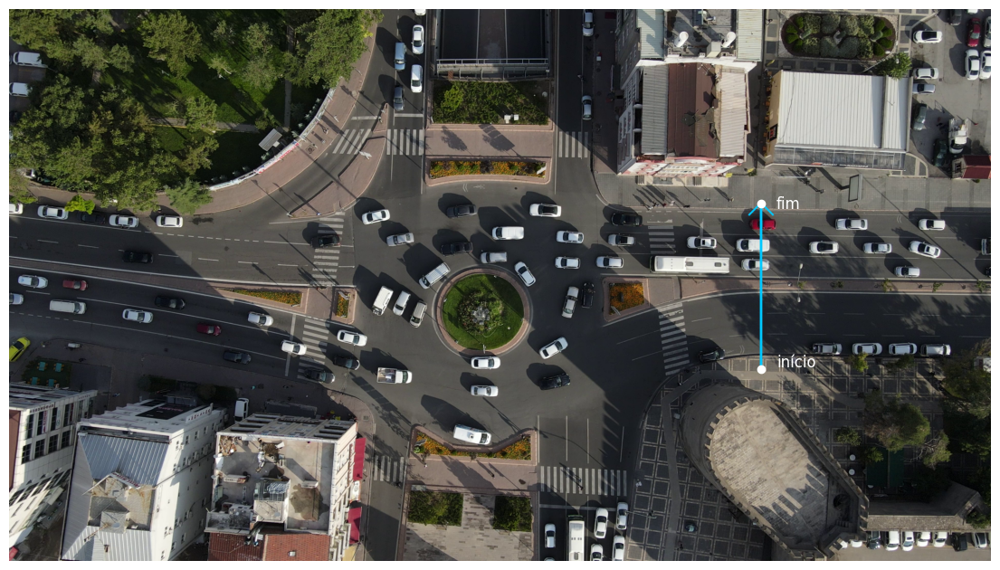

In [8]:
primeiro = next(sv.get_video_frames_generator(str(VIDEO)))
INICIO, FIM = sv.Point(1470, 705), sv.Point(1470, 380)
referencia = primeiro.copy()
cv2.arrowedLine(referencia, (1470, 705), (1470, 380), (255, 200, 0), 4)
plt.imshow(cv2.cvtColor(referencia, cv2.COLOR_BGR2RGB))
plt.scatter([INICIO.x, FIM.x], [INICIO.y, FIM.y], color="white")
plt.text(1500, 700, "início", color="white")
plt.text(1500, 390, "fim", color="white")
plt.axis("off")
plt.show()

A linha vai de baixo para cima no acesso direito. Nesta orientação, chamaremos de **entrada** a passagem da direita para a esquerda, em direção à rotatória, e de **saída** a passagem da esquerda para a direita. Esses nomes dependem da orientação da linha e do contexto da cena, não de uma semântica automática do software.

Usaremos os **quatro cantos da caixa como âncoras**. Um evento requer que todos os cantos tenham sido observados de um lado e, depois, todos do outro. O parâmetro `minimum_crossing_threshold=1` exige uma observação elegível consecutiva do novo lado; a escolha dos quatro cantos vem de `triggering_anchors`. Enquanto a caixa intercepta a linha, ela não estabelece um lado inequívoco. Aparecer já do outro lado não constitui evidência de cruzamento.

Esta definição conta a passagem completa da caixa. Em uma fila, o centro de um veículo parado pode oscilar poucos pixels ao redor da linha por variações da detecção. Uma regra baseada apenas no centro pode transformar essa oscilação em entradas e saídas artificiais; duas observações de confirmação nem sempre resolvem o problema.

A linha tem extensão finita. A `LineZone` exige que **todas as âncoras** estejam dentro da faixa delimitada pelas perpendiculares aos extremos. Nesta linha vertical, os quatro cantos precisam satisfazer `380 ≤ y ≤ 705`; uma caixa que ultrapasse qualquer extremo não atualiza o estado geométrico naquele quadro. Essa observação ignorada não apaga automaticamente o histórico anterior do ID.

## Referência manual antes das previsões

Faça a conferência manual sobre o vídeo original, sem caixas, IDs ou contadores automáticos. O procedimento evita que as previsões orientem a referência usada para avaliá-las.

- Observe apenas o segmento do acesso direito mostrado acima.
- Atribua um `id_manual` próprio a cada veículo; não copie IDs do tracker.
- Registre o primeiro quadro em que o veículo termina de passar para o outro lado, após ter sido observado integralmente do lado de origem. Numere os quadros a partir de zero e use `tempo_s = frame / fps`.
- Exija passagem completa; registre oclusões, limites visuais ambíguos e veículos sobre a linha desde o início como casos incertos, sem adivinhá-los.
- Registre direção, cor/faixa e observações para permitir correspondência posterior entre eventos. Salve a tabela antes de examinar o resultado automático.

A extensão visível de um veículo e a caixa prevista podem divergir. Essa diferença deve ser discutida ao comparar os instantes, especialmente em veículos alongados ou parcialmente ocluídos. Na referência manual, não invente uma caixa oculta: marque os casos ambíguos como incertos.

In [9]:
FFMPEG = imageio_ffmpeg.get_ffmpeg_exe()
def compactar_previa(origem, destino):
    comando = [FFMPEG, "-y", "-v", "error", "-i", str(origem), "-an",
               "-vf", "scale=960:-2", "-c:v", "libx264", "-crf", "24",
               "-preset", "fast", "-pix_fmt", "yuv420p", str(destino)]
    subprocess.run(comando, check=True, capture_output=True)

In [10]:
VIDEO_REFERENCIA = SAIDA / "rotatoria_referencia.mp4"
comando = [FFMPEG, "-y", "-v", "error", "-i", str(VIDEO), "-an",
           "-c:v", "libx264", "-crf", "24", "-preset", "fast",
           "-pix_fmt", "yuv420p", "-movflags", "+faststart", str(VIDEO_REFERENCIA)]
subprocess.run(comando, check=True, capture_output=True)
PREVIA_REFERENCIA = SAIDA / "rotatoria_referencia_previa.mp4"
compactar_previa(VIDEO_REFERENCIA, PREVIA_REFERENCIA)
display(Video(str(PREVIA_REFERENCIA), embed=True, width=960))

In [11]:
COLUNAS_MANUAIS = ["id_manual", "frame", "tempo_s", "direcao", "descricao", "incerto"]
ARQUIVO_MANUAL = SAIDA / "contagem_manual.csv"
if not ARQUIVO_MANUAL.exists():
    pd.DataFrame(columns=COLUNAS_MANUAIS).to_csv(ARQUIVO_MANUAL, index=False)
print("Preencha e preserve:", ARQUIVO_MANUAL)
print("Direções aceitas: entrada e saida. Incerto: sim ou nao.")

Preencha e preserve: resultados/projeto_final/contagem_manual.csv
Direções aceitas: entrada e saida. Incerto: sim ou nao.


A prévia embutida foi reduzida para 960 × 540; use `rotatoria_referencia.mp4`, em resolução original, para ampliar veículos e inspecionar a passagem completa.

O CSV começa vazio deliberadamente. Ele é um formulário de anotação, não uma referência já validada. No Colab, use o painel **Arquivos** para baixar, editar e reenviar o CSV para a mesma pasta.

O notebook completo pode ser executado para demonstrar o sistema. Para realizar uma avaliação independente, interrompa antes da inferência, conclua a anotação manual e preserve o arquivo original. Nenhuma célula abaixo o preencherá com predições.

## Detecção antes da associação temporal

O detector estima caixas, classes e confiança em cada quadro. ByteTrack receberá essas detecções e tentará associá-las a trajetórias existentes. Um rótulo como `car` descreve a categoria; um `tracker_id` identifica uma hipótese temporal de objeto.

Usaremos `conf=0.30` na detecção e `high_conf_det_threshold=0.60` no tracker. Assim, a faixa de confiança de 0,30 até abaixo de 0,60 ainda pode recuperar trajetórias existentes na segunda associação do ByteTrack. Filtrar todas as caixas abaixo de 0,60 antes do tracker eliminaria essa possibilidade.

In [12]:
modelo = YOLO(str(PESO))
NOMES = modelo.names
IDS_VEICULOS = [i for i, nome in NOMES.items() if nome in {"bus", "car", "truck", "van"}]
assert set(NOMES.values()) == {"bus", "car", "truck", "van"}
CONF_DETECTOR, CONF_ALTA = 0.30, 0.60
print(NOMES)
print("Classes selecionadas:", IDS_VEICULOS)

{0: 'bus', 1: 'car', 2: 'truck', 3: 'van'}
Classes selecionadas: [0, 1, 2, 3]


In [13]:
def detectar(frame):
    resultado = modelo.predict(frame, conf=CONF_DETECTOR, iou=0.50,
                                imgsz=640, device=DISPOSITIVO, verbose=False)[0]
    deteccoes = sv.Detections.from_ultralytics(resultado)
    return deteccoes[np.isin(deteccoes.class_id, IDS_VEICULOS)]

deteccoes_iniciais = detectar(primeiro)
print("Detecções no primeiro quadro:", len(deteccoes_iniciais))
print("Na faixa fraca:", int((deteccoes_iniciais.confidence < CONF_ALTA).sum()))

Detecções no primeiro quadro: 92
Na faixa fraca: 7


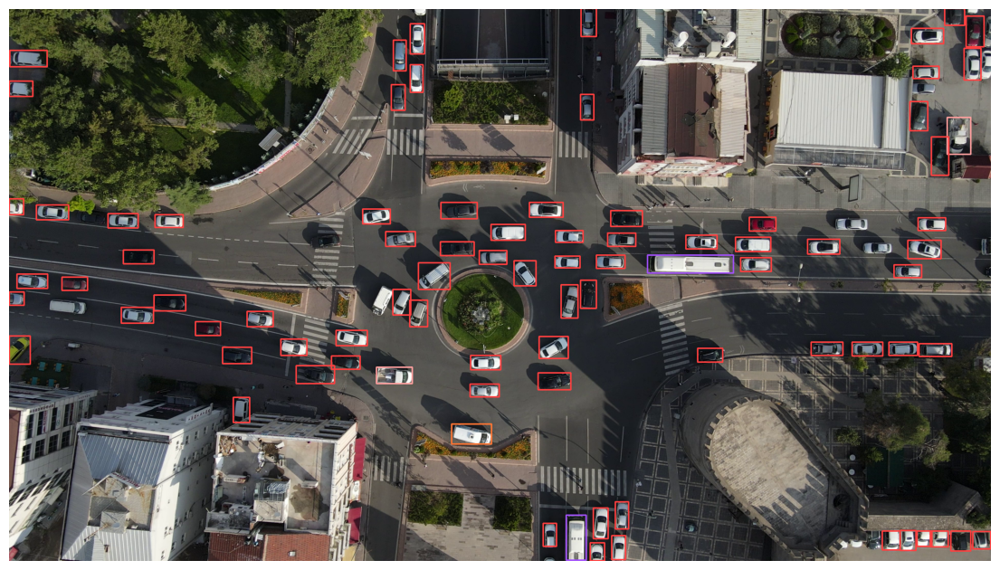

In [14]:
visualizacao = deteccoes_iniciais[deteccoes_iniciais.confidence >= CONF_ALTA]
caixas_preview = sv.BoxAnnotator(thickness=2)
preview = caixas_preview.annotate(primeiro.copy(), visualizacao)
plt.imshow(cv2.cvtColor(preview, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

O filtro de 0,60 foi usado **somente na figura**, para facilitar a inspeção inicial. A função `detectar` mantém as detecções a partir de 0,30 para o tracker.

As caixas de `from_ultralytics` já estão em pixels da imagem original. Não multiplique suas coordenadas por `1920/640`: a biblioteca Ultralytics já reverteu a transformação usada na inferência. Contar caixas neste quadro não mede veículos que passaram pela linha.

## Associação e critério geométrico

A implementação de ByteTrack usada aqui combina predição de movimento e sobreposição entre caixas. Ela **não extrai descritores de aparência**, não usa os pixels do quadro para reidentificação e não compensa o movimento da câmera.

Novas trajetórias são criadas a partir do grupo de alta confiança, a partir de 0,60, e exigem duas observações consecutivas para confirmação. O limiar adicional de ativação será 0,30; nesta implementação, ele não permite que detecções do grupo de baixa confiança iniciem trajetórias. Detecções ainda sem identidade confirmada podem receber `tracker_id=-1`; elas serão excluídas da visualização e da contagem, após a atualização do tracker. Mesmo nos quadros sem detecção, o tracker será atualizado para avançar o estado temporal.

In [15]:
def criar_tracker():
    return ByteTrackTracker(frame_rate=info.fps, lost_track_buffer=30,
                            high_conf_det_threshold=CONF_ALTA,
                            track_activation_threshold=0.30,
                            minimum_consecutive_frames=2, minimum_iou_threshold=0.10)

def criar_linha():
    return sv.LineZone(start=INICIO, end=FIM,
                       triggering_anchors=[sv.Position.TOP_LEFT, sv.Position.TOP_RIGHT,
                                          sv.Position.BOTTOM_LEFT, sv.Position.BOTTOM_RIGHT],
                       minimum_crossing_threshold=1)

Antes de contar veículos, verificaremos a orientação da API com trajetórias sintéticas de caixas. Também verificaremos que oscilar sobre a linha sem sair dela não produz eventos. Esse teste checa a convenção `in/out`; não valida o detector nem a contagem do vídeo real. A linha usada no teste tem estado próprio.

In [16]:
def testar_direcao(posicoes):
    linha_teste = criar_linha()
    for x in posicoes:
        caixa = np.array([[x - 10, 490, x + 10, 510]], dtype=float)
        objeto = sv.Detections(xyxy=caixa, tracker_id=np.array([1]))
        linha_teste.trigger(objeto)
    return linha_teste.in_count, linha_teste.out_count

assert testar_direcao([1510, 1500, 1490, 1460, 1450]) == (1, 0)
assert testar_direcao([1430, 1440, 1450, 1480, 1490]) == (0, 1)
assert testar_direcao([1490, 1471, 1469, 1471, 1469]) == (0, 0)
print("Verificado: direita → esquerda = entrada; esquerda → direita = saída.")

Verificado: direita → esquerda = entrada; esquerda → direita = saída.


## Anotações e eventos auditáveis

Cor e rastro serão vinculados ao `tracker_id`, para acompanhar visualmente cada hipótese de identidade. O rastro mostrará o centro da caixa para visualizar o movimento, enquanto a contagem usará os quatro cantos para confirmar a passagem completa. O painel exibirá os acumulados de entrada e saída, enquanto o CSV preservará o instante e a identidade de cada evento.

Uma trajetória é estado: ela acumula posições. Criar um novo anotador de rastros, um novo tracker e uma nova linha antes de cada processamento evita misturar históricos de vídeos ou de reexecuções.

In [17]:
caixas = sv.BoxAnnotator(thickness=2, color_lookup=sv.ColorLookup.TRACK)
rotulos = sv.LabelAnnotator(text_scale=0.35, text_thickness=1, text_padding=3,
                            color_lookup=sv.ColorLookup.TRACK)
anotador_linha = sv.LineZoneAnnotator(thickness=3, color=sv.Color.from_hex("38BDF8"),
                                     display_in_count=False, display_out_count=False)
def criar_rastros():
    return sv.TraceAnnotator(position=sv.Position.CENTER, trace_length=60,
                             thickness=2, color_lookup=sv.ColorLookup.TRACK)

In [18]:
def registrar_eventos(indice, deteccoes, entradas, saidas):
    centros = deteccoes.get_anchors_coordinates(sv.Position.CENTER)
    for direcao, mascara in (("entrada", entradas), ("saida", saidas)):
        for j in np.flatnonzero(mascara):
            eventos.append({"frame": indice, "tempo_s": indice / info.fps,
                            "tracker_id": int(deteccoes.tracker_id[j]),
                            "classe": NOMES[int(deteccoes.class_id[j])], "direcao": direcao,
                            "centro_x": float(centros[j, 0]), "centro_y": float(centros[j, 1]),
                            "confianca": float(deteccoes.confidence[j])})

As máscaras retornadas por `LineZone.trigger` têm uma posição para cada detecção rastreada do quadro. `True` indica que aquela detecção confirmou um evento naquela chamada. Registramos somente esses eventos, sem criar uma segunda regra de cruzamento que possa divergir do contador.

In [19]:
def desenhar_painel(frame):
    cv2.rectangle(frame, (20, 20), (840, 110), (25, 31, 40), -1)
    cv2.putText(frame, "YOLOv8x + ByteTrack | acesso direito", (40, 53),
                cv2.FONT_HERSHEY_SIMPLEX, 0.75, (255, 255, 255), 2)
    texto = f"Entradas: {linha.in_count} | Saidas: {linha.out_count}"
    cv2.putText(frame, texto, (40, 91), cv2.FONT_HERSHEY_SIMPLEX,
                0.85, (255, 255, 255), 2)
    return frame

In [20]:
def anotar(frame, deteccoes):
    imagem = rastros.annotate(frame.copy(), deteccoes)
    imagem = caixas.annotate(imagem, deteccoes)
    textos = [f"#{tid} {NOMES[int(cid)]}" for tid, cid in
              zip(deteccoes.tracker_id, deteccoes.class_id)]
    imagem = rotulos.annotate(imagem, deteccoes, labels=textos)
    imagem = anotador_linha.annotate(imagem, line_counter=linha)
    return desenhar_painel(imagem)

## Processamento do vídeo completo

A função abaixo mostra a ordem completa das operações. Primeiro detectamos e associamos; depois removemos IDs não confirmados, atualizamos a linha, registramos os eventos e desenhamos o quadro.

Não saltaremos quadros. O FPS do vídeo define o tempo da cena, independentemente de a inferência executar mais devagar ou mais rápido. `lost_track_buffer=30` corresponde a aproximadamente um segundo de tolerância na referência de 30 FPS, ajustada pela biblioteca ao FPS configurado.

In [21]:
def processar_quadro(frame, indice):
    deteccoes = detectar(frame)
    deteccoes = tracker.update(deteccoes)
    deteccoes = deteccoes[deteccoes.tracker_id >= 0]
    entradas, saidas = linha.trigger(deteccoes)
    registrar_eventos(indice, deteccoes, entradas, saidas)
    ids_vistos.update(deteccoes.tracker_id.tolist())
    serie.append((indice, indice / info.fps, len(deteccoes), linha.in_count, linha.out_count))
    imagem = anotar(frame, deteccoes)
    if indice in {0, info.total_frames // 2, info.total_frames - 1}:
        cv2.imwrite(str(SAIDA / f"frame_{indice:04d}.jpg"), imagem)
    return imagem

A célula seguinte é o ponto de início de uma execução. Ela reinicializa todos os objetos e coleções que guardam histórico, inclusive ao ser executada novamente. Os arquivos de resultado dessa execução serão substituídos; copie-os para outra pasta antes de comparar configurações.

In [22]:
tracker, linha, rastros = criar_tracker(), criar_linha(), criar_rastros()
eventos, serie, ids_vistos = [], [], set()
VIDEO_BRUTO = SAIDA / "rotatoria_anotada_bruto.mp4"
quadros = sv.get_video_frames_generator(str(VIDEO))
inicio_execucao = perf_counter()
with sv.VideoSink(str(VIDEO_BRUTO), video_info=info) as gravador:
    for indice, frame in enumerate(tqdm(quadros, total=info.total_frames)):
        gravador.write_frame(processar_quadro(frame, indice))
segundos_processamento = perf_counter() - inicio_execucao
assert len(serie) == info.total_frames
print("Quadros processados:", len(serie))
print("Tempo de processamento em segundos:", round(segundos_processamento, 2))

  0%|          | 0/806 [00:00<?, ?it/s]

Quadros processados: 806
Tempo de processamento em segundos: 32.63


## Resultados e consistência

A tabela de eventos permite localizar cada passagem no vídeo. Os contadores visuais e o CSV precisam concordar, pois representam a mesma regra aplicada à mesma sequência. Essa consistência interna não substitui a comparação com a referência manual.

In [23]:
COLUNAS_EVENTOS = ["frame", "tempo_s", "tracker_id", "classe", "direcao",
                  "centro_x", "centro_y", "confianca"]
tabela_eventos = pd.DataFrame(eventos, columns=COLUNAS_EVENTOS)
tabela_eventos.to_csv(SAIDA / "eventos.csv", index=False)
assert (tabela_eventos.direcao == "entrada").sum() == linha.in_count
assert (tabela_eventos.direcao == "saida").sum() == linha.out_count
assert tabela_eventos.frame.between(0, info.total_frames - 1).all()
display(tabela_eventos.round(3))

,frame,tempo_s,tracker_id,classe,direcao,centro_x,centro_y,confianca
0,69,2.302,89,car,entrada,1438.014,421.995,0.773
1,98,3.270,34,car,entrada,1440.256,466.522,0.832
2,112,3.737,44,car,saida,1504.273,624.913,0.799
3,117,3.904,62,car,entrada,1443.466,421.443,0.450
4,142,4.738,46,car,saida,1502.060,584.415,0.779
5,187,6.240,92,car,entrada,1442.085,419.524,0.627
6,199,6.640,93,car,entrada,1440.621,468.326,0.588
7,246,8.208,59,car,entrada,1443.837,510.441,0.765
8,257,8.575,49,car,entrada,1439.401,431.237,0.831
9,305,10.177,30,car,saida,1501.856,624.381,0.813


In [24]:
colunas = ["frame", "tempo_s", "objetos_no_quadro", "entradas", "saidas"]
tabela_temporal = pd.DataFrame(serie, columns=colunas)
tabela_temporal.to_csv(SAIDA / "serie_temporal.csv", index=False)
resumo = {"quadros": len(serie), "entradas": linha.in_count, "saidas": linha.out_count,
          "ids_confirmados_distintos": len(ids_vistos), "ancoras": "quatro_cantos",
          "confirmacao_cruzamento": 1, "conf_detector": CONF_DETECTOR,
          "conf_alta": CONF_ALTA, "segundos_processamento": segundos_processamento,
          "video_sha256": SHA_VIDEO, "peso_sha256": SHA_PESO}
(SAIDA / "resumo.json").write_text(json.dumps(resumo, indent=2))
display(resumo)

{'quadros': 806,
 'entradas': 7,
 'saidas': 9,
 'ids_confirmados_distintos': 129,
 'ancoras': 'quatro_cantos',
 'confirmacao_cruzamento': 1,
 'conf_detector': 0.3,
 'conf_alta': 0.6,
 'segundos_processamento': 32.631043632514775,
 'video_sha256': 'aadf68faccd6ff69a814e8d1139a5f7ba7b520a5e0da9e685398a130ddc5c661',
 'peso_sha256': '49e414e2dfc53569a3fa9b03a5e9bccaa4ba22f86c54d2e5b3a272eaef8534bc'}

Três quantidades respondem a perguntas diferentes:

- **Objetos no quadro:** quantidade de detecções com identidade confirmada naquele instante, em toda a imagem. Seria necessária uma região delimitada para estimar ocupação apenas em uma área.
- **IDs distintos:** quantidade de identificadores emitidos durante o clipe. Fragmentação pode produzir vários IDs para o mesmo veículo; uma troca pode transferir um ID entre veículos.
- **Cruzamentos:** eventos direcionais observados no segmento. Um mesmo veículo pode produzir novos eventos se voltar a atravessá-lo.

Logo, IDs distintos não são uma estimativa automaticamente válida de veículos únicos, e cruzamentos não equivalem à ocupação instantânea.

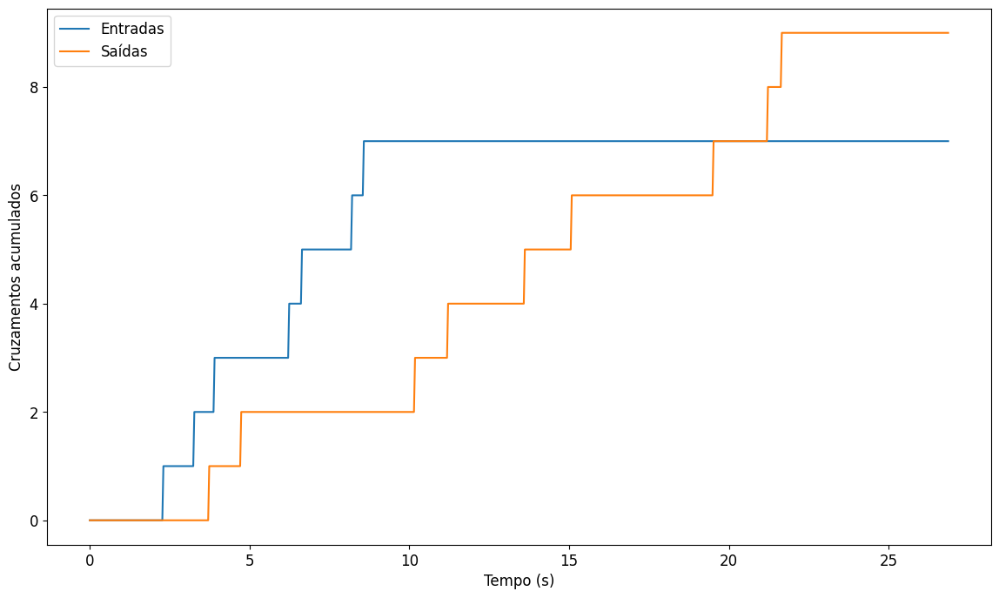

In [25]:
plt.plot(tabela_temporal.tempo_s, tabela_temporal.entradas, label="Entradas")
plt.plot(tabela_temporal.tempo_s, tabela_temporal.saidas, label="Saídas")
plt.xlabel("Tempo (s)")
plt.ylabel("Cruzamentos acumulados")
plt.legend()
plt.show()

Cada degrau representa um ou mais eventos confirmados. Um trecho horizontal indica ausência de novos cruzamentos segundo o sistema, mesmo que existam muitos veículos parados ou circulando em outras partes da imagem.

Os totais são previsões automáticas sob a definição de passagem completa. Não constituem, por si só, uma medida de qualidade. Cada evento deve ser comparado com a anotação manual independente, e cada evento manual certo deve ser procurado no resultado automático.

## Vídeo anotado e inspeção visual

O arquivo intermediário preserva todos os quadros. A conversão para H.264 torna a reprodução compatível com o navegador, mantendo resolução e taxa de quadros no arquivo final. A prévia embutida é reduzida para 960 × 540 para manter o notebook leve. Examine também os quadros de início, meio e fim; uma visualização consistente não prova que todas as identidades estejam corretas.

In [26]:
VIDEO_FINAL = SAIDA / "rotatoria_yolov8x_bytetrack.mp4"
comando = [FFMPEG, "-y", "-v", "error", "-i", str(VIDEO_BRUTO), "-an",
           "-c:v", "libx264", "-crf", "20", "-preset", "fast",
           "-pix_fmt", "yuv420p", "-movflags", "+faststart", str(VIDEO_FINAL)]
subprocess.run(comando, check=True, capture_output=True)
info_final = sv.VideoInfo.from_video_path(str(VIDEO_FINAL))
assert info_final.total_frames == info.total_frames
assert (info_final.width, info_final.height) == (info.width, info.height)
assert np.isclose(info_final.fps, info.fps, atol=0.01)

In [27]:
PREVIA_FINAL = SAIDA / "rotatoria_anotada_previa.mp4"
compactar_previa(VIDEO_FINAL, PREVIA_FINAL)
display(Video(str(PREVIA_FINAL), embed=True, width=960))

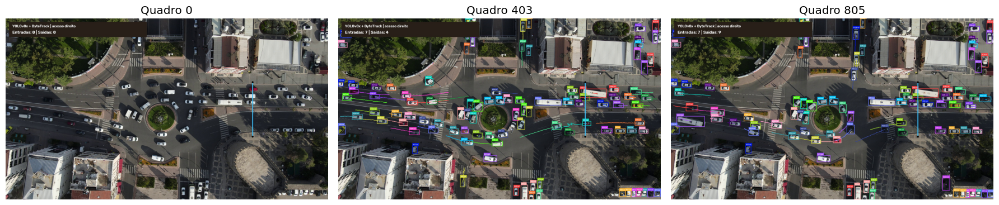

In [28]:
amostras = [0, info.total_frames // 2, info.total_frames - 1]
fig, eixos = plt.subplots(1, 3, figsize=(18, 5))
for eixo, indice in zip(eixos, amostras):
    imagem = cv2.imread(str(SAIDA / f"frame_{indice:04d}.jpg"))
    eixo.imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB))
    eixo.set_title(f"Quadro {indice}")
    eixo.axis("off")
plt.tight_layout()
plt.show()

## Comparação com a anotação manual

Depois de congelar a referência manual, compare cada evento por direção, posição/faixa, aparência e instante. Use uma tolerância temporal declarada: a confirmação do contador ocorre quando a caixa inteira muda de lado, e seus limites podem não coincidir exatamente com a extensão visual do veículo.

Um evento previsto sem correspondência é um possível falso positivo de cruzamento. Um evento manual certo sem previsão é uma possível omissão. Eventos repetidos para a mesma passagem sugerem fragmentação, troca de ID ou oscilação dos limites da caixa. Compare também as associações; **totais iguais podem esconder erros que se cancelam**.

A comparação abaixo só calcula a diferença entre totais quando houver anotações manuais. Não produz precisão, recall, MOTA ou IDF1: essas métricas exigem correspondências ou anotações adicionais adequadas à tarefa.

Antes da comparação, validamos o CSV. Aceitamos variações de acentos, maiúsculas e espaços externos em `direcao` e `incerto`: `saída` equivale a `saida`, e `Não` equivale a `nao`. Categorias desconhecidas, identificação ou descrição vazias e quadro/tempo inválidos interrompem a análise com uma indicação das linhas a corrigir.

O quadro deve ser um inteiro entre zero e o último quadro do vídeo. O tempo deve ser finito, não negativo e corresponder a `frame / fps`, com tolerância de um quadro para arredondamento. A normalização ocorre somente na memória; o CSV original é preservado, inclusive quando vazio.

In [ ]:
import unicodedata

def normalizar_categoria(valor):
    if pd.isna(valor):
        return ""
    texto = unicodedata.normalize("NFKD", str(valor)).strip().casefold()
    return "".join(letra for letra in texto if not unicodedata.combining(letra))

In [ ]:
manual = pd.read_csv(ARQUIVO_MANUAL)
faltantes = set(COLUNAS_MANUAIS) - set(manual.columns)
if faltantes:
    raise ValueError("Colunas ausentes no CSV: " + ", ".join(sorted(faltantes)))
categorias = {"direcao": {"entrada", "saida"}, "incerto": {"sim", "nao"}}
for coluna, permitidos in categorias.items():
    manual[coluna] = manual[coluna].map(normalizar_categoria)
    invalidos = ~manual[coluna].isin(permitidos)
    if invalidos.any():
        linhas = (manual.index[invalidos] + 2).tolist()
        raise ValueError(f"{coluna}: valores inválidos nas linhas do CSV {linhas}. Use {sorted(permitidos)}.")

In [ ]:
quadros = pd.to_numeric(manual["frame"], errors="coerce")
tempos = pd.to_numeric(manual["tempo_s"], errors="coerce")
invalidos = (~np.isfinite(quadros) | (quadros % 1 != 0) | (quadros < 0)
             | (quadros >= info.total_frames) | ~np.isfinite(tempos) | (tempos < 0)
             | ((tempos - quadros / info.fps).abs() > 1 / info.fps))
if invalidos.any():
    linhas = (manual.index[invalidos] + 2).tolist()
    raise ValueError(f"Frame ou tempo inválido nas linhas do CSV {linhas}; confira frame / fps.")
manual["frame"] = quadros.astype(int)
manual["tempo_s"] = tempos

In [ ]:
for coluna in ["id_manual", "descricao"]:
    invalidos = manual[coluna].isna() | manual[coluna].astype(str).str.strip().eq("")
    if invalidos.any():
        linhas = (manual.index[invalidos] + 2).tolist()
        raise ValueError(f"{coluna}: campo vazio nas linhas do CSV {linhas}.")

In [ ]:
if manual.empty:
    print("Referência manual ainda vazia; nenhuma métrica de qualidade foi calculada.")
else:
    certas = manual[manual.incerto == "nao"]
    previstos = tabela_eventos.direcao.value_counts().reindex(["entrada", "saida"], fill_value=0)
    observados = certas.direcao.value_counts().reindex(["entrada", "saida"], fill_value=0)
    comparacao = pd.DataFrame({"manual_certo": observados, "automatico": previstos})
    comparacao["diferenca"] = comparacao.automatico - comparacao.manual_certo
    display(comparacao)
    print("Inspecione a correspondência evento a evento antes de concluir sobre qualidade.")

## Limitações e investigação

A detecção pode falhar em sombras, veículos pequenos e oclusões; um rótulo de classe pode estar errado mesmo quando a passagem foi contada. ByteTrack associa geometria e movimento, portanto veículos próximos e visualmente semelhantes podem trocar de ID. Uma confiança alta do detector não certifica a identidade temporal.

O uso de uma linha fixa pressupõe que sua posição continue representando o mesmo local. A deriva da câmera pode deslocar veículos e a própria via em relação à linha. Um sistema operacional com drone móvel pode exigir estabilização, compensação de movimento e uma referência geométrica adequada; este notebook não implementa essas etapas.

Experimentos sugeridos:

- Troque os quatro cantos por `CENTER` ou `BOTTOM_CENTER` e descreva como muda a definição de passagem. Inspecione especialmente o veículo parado sobre a linha e procure eventos causados por oscilação da caixa.
- Aumente a confiança mínima do detector de 0,30 para 0,60 e procure trajetórias que deixam de aproveitar associações de menor confiança.
- Varie a confirmação de cruzamento e analise o compromisso entre atraso e sensibilidade à oscilação.
- Troque o checkpoint especializado por um detector genérico somente em uma nova configuração, preservando todos os resultados anteriores.

Altere um fator por vez e reinicie a execução completa. Não escolha parâmetros apenas para reproduzir um total conhecido; use a referência independente e documente casos de erro.

## Entrega do projeto

Entregue o notebook executado, `rotatoria_yolov8x_bytetrack.mp4`, `eventos.csv`, `serie_temporal.csv`, `resumo.json`, `ambiente.json` e sua `contagem_manual.csv`. Acrescente uma análise curta de três eventos corretos, um caso incerto ou erro observado e uma limitação de generalização.

A conclusão deve distinguir funcionamento do código, qualidade visual e desempenho do sistema. O clipe demonstra um método de análise; sozinho não estabelece acurácia operacional em outros horários, câmeras, altitudes ou distribuições de tráfego.

## Referências técnicas

Consultadas em 26/09/2026; as versões executáveis são as fixadas no início do notebook.

- [Traffic Analysis: vídeo e peso oficiais](https://github.com/roboflow/supervision/tree/develop/examples/traffic_analysis).
- [API Supervision: LineZone e convenções de cruzamento](https://supervision.roboflow.com/latest/detection/tools/line_zone/).
- [API Trackers: ByteTrack](https://trackers.roboflow.com/latest/trackers/bytetrack/).
- [Ultralytics: predict e formatos de entrada e saída](https://docs.ultralytics.com/modes/predict/).
- [ByteTrack: Multi-Object Tracking by Associating Every Detection Box](https://arxiv.org/abs/2110.06864), ECCV 2022.